# Cutout_1: extract common region in images

The technique used in the Offsets_x notebooks depends on the multiple images in a sequence being almost centralized on each other. That can be achieved with an equatorial mount. Lacking one, we resort to fixed-tripod image sequences and apply the tracking a posterirori, during image processing.

That is easier to do in very large field (14mm) and relatively short sequences (~few minutes). But on narrower fields (85-135mm and beyond), and/or longer sequences, images do not fully overlap. The non-overlapping regions tend to make star detection and tracking very tricky. 

This notebook contains a method to pre-extract the common region of a sequence of images (regardless of focal lenght and duration), within a few pixels precision. Then the algorithms in the Offsets_x notebooks can be applied to the resulting sequence of subimages, thus leaving for the final drizzle operation only the task of handling the small displacements between images. 

In [1]:
# %matplotlib widget

import os, glob
import time, datetime
import math

import numpy as np
from matplotlib.pyplot import imshow
import matplotlib.pyplot as plt

from scipy import stats

from astropy.io import fits
from astropy.table import Table
from astropy.stats import SigmaClip
from astropy.convolution import Gaussian2DKernel, interpolate_replace_nans

from align_images import align, tools, cc2d

from photutils import centroids
from photutils.aperture import CircularAperture

import rawpy
import exifread

from datapath import DATA

## Initialization

Read data and set up parameters.

In [2]:
# images to generate cutouts from - these are background-subtracted already
data_dirpath = os.path.join(DATA,'astrophotography_data/Andromeda_2022/135mm16s3200ISO')
image_list = list(glob.glob(data_dirpath + '/*.bkg_subtracted.fits'))
image_list.sort()

# suffix for image names that contain the cutouts
cutout_suffix = '.cutout.fits'

len(image_list)

900

In [3]:
# read base image - we need to know its size
image_name = image_list[int(len(image_list)/2)]   # mid-point

f = fits.open(image_name)
imarray_base = f[1].data
f.close()    

print(imarray_base.shape)

(2848, 4256)


The shift finding algorithm in align_images.compute_shifts seems to get confused when working with images that are too much off-center. Since we have to handle the shifts anyway, before using them to extract the cutouts, we adopt a modeling approach. This was tested with the Andromeda_2022 data set; it remains to be seen if it can handle other data sets too.

Basically, we compute shifts using as origin the mid-point image in the sequence. Once this reference image is defined, we use trial-and-error to trim the end-points of the image sequence until we get a clean set of shifts that can be reasonably fitted by a straight line. We then use this line to generate shifts for all images in the sequence, including the ones that were trimmed out of the sequence at the two end points.

In [4]:
# define end points where to trim input list, and compute required memory size 
start = 300
end = 600
step = 20

list_length = int((end - start) / step)
print(list_length)

list_slice = slice(start, end, step) 

15


## Functions

In [5]:
# fits a straight line thru shifts and compute residuals
def fit_line(shifts, array_index, start, step):
    # array_index designates either X (0) or Y(1)
    
    # shifts are expressed as a function of the data point
    # index as specified by the list_slice

    x_list = []
    for i in list(range(len(shifts))):
        x_value = i * step + start 
        x_list.append(x_value)
    x = np.array(x_list)
    
    y_list = []
    for i in list(range(len(shifts))):
        y_list.append(shifts[i][array_index])
    y = np.array(y_list)
    
    slope, intercept, r_value, p_value, std_err = stats.linregress(x, y)

    pred_values = slope * x + intercept
    residuals = y - pred_values
    stdev = math.sqrt(np.sum(residuals**2) / len(residuals))
    
    return stdev, slope, intercept, x, y, residuals

In [6]:
def plot_residuals(shifts, array_index, start, step):

    # fit line
    stdev, slope, intercept, x_data, y_data, residuals = fit_line(shifts, array_index, start, step)
        
    # plot
    fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.set_size_inches(12.5, 5.5)

    for xp,yp,r in zip(x_data, y_data, residuals):
        ax1.plot(xp, yp, 'ro')
        ax2.plot(xp, r, 'ro')

    ax1.grid()
    ax2.grid()

In [7]:
def corner_coordinates(index, printinfo=True):
    x_center = slope_x * index + intercept_x + image_half_size_x
    y_center = slope_y * index + intercept_y + image_half_size_y

    x_topleft = x_center - cutout_half_size_x # min is 0
    y_topleft = y_center - cutout_half_size_y # min is 0

    x_bottomright = x_center + cutout_half_size_x # max is 4256 - 1
    y_bottomright = y_center + cutout_half_size_y # max is 2848 - 1

    if printinfo:
        # print("X and Y shifts: ", x_center_last, y_center_last)
        print("top left corner X and Y:     ", x_topleft, y_topleft)
        print("bottom right corner X and Y: ", x_bottomright, y_bottomright)
    
    return [[x_topleft, y_topleft], [x_bottomright, y_bottomright]]

In [8]:
def write_cutout(cutout, image_name):
    today = datetime.datetime.now().ctime()
    
    cutout_name = image_name.replace('.bkg_subtracted.fits', '.cutout.fits')

    print("Writing cutout: ", cutout_name, today)

    # Create FITS 32-bit floating point file with cutout
    hdr = fits.Header()
    hdr['DATE'] = today
    hdr['PATH'] = cutout_name
    primary_hdu = fits.PrimaryHDU(header=hdr)

    hdu_data   = fits.ImageHDU(cutout.astype('float32'))

    hdul = fits.HDUList([primary_hdu, hdu_data])
    hdul.writeto(cutout_name, overwrite=True)
    
    return cutout_name

In [9]:
# make even numbers
def make_even(num):
    intnum = int(num)
    if intnum % 2:
        return intnum+1
    else:
        return intnum

## Find shifts

In [10]:
# build cube to store results
cube = np.zeros(shape=(list_length, imarray_base.shape[0], imarray_base.shape[1]), dtype='float32')

In [11]:
# read bkg-subtracted images and add them to cube
plane = 0

for index, image_name in enumerate(image_list[list_slice]):
    
    f = fits.open(image_name)
    subtracted = f[1].data
    f.close()
    cube[index,::] = subtracted

    print(index, image_name)

0 /Users/busko/Projects/astrophotography_data/Andromeda_2022/135mm16s3200ISO/DSC01562.bkg_subtracted.fits
1 /Users/busko/Projects/astrophotography_data/Andromeda_2022/135mm16s3200ISO/DSC01582.bkg_subtracted.fits
2 /Users/busko/Projects/astrophotography_data/Andromeda_2022/135mm16s3200ISO/DSC01602.bkg_subtracted.fits
3 /Users/busko/Projects/astrophotography_data/Andromeda_2022/135mm16s3200ISO/DSC01622.bkg_subtracted.fits
4 /Users/busko/Projects/astrophotography_data/Andromeda_2022/135mm16s3200ISO/DSC01642.bkg_subtracted.fits
5 /Users/busko/Projects/astrophotography_data/Andromeda_2022/135mm16s3200ISO/DSC01662.bkg_subtracted.fits
6 /Users/busko/Projects/astrophotography_data/Andromeda_2022/135mm16s3200ISO/DSC01682.bkg_subtracted.fits
7 /Users/busko/Projects/astrophotography_data/Andromeda_2022/135mm16s3200ISO/DSC01702.bkg_subtracted.fits
8 /Users/busko/Projects/astrophotography_data/Andromeda_2022/135mm16s3200ISO/DSC01722.bkg_subtracted.fits
9 /Users/busko/Projects/astrophotography_data/

In [12]:
# apply align_images procedure, using "roll" to fast-align integer pixels. 
shifts = align.compute_shifts(cube, ref_frame=cube[int(cube.shape[0]/2)], processes=8)
# shifts = align.compute_shifts(cube, ref_frame=cube[0], processes=8)

aligned_cube = align.roll_cube(cube, shifts)
# aligned_cube = align.align_cube(cube, shifts, processes=8)

Computing shifts... Done.


## Check result

In [13]:
for plane in list(range(aligned_cube.shape[0])):
    aligned_cube[0] += aligned_cube[plane]

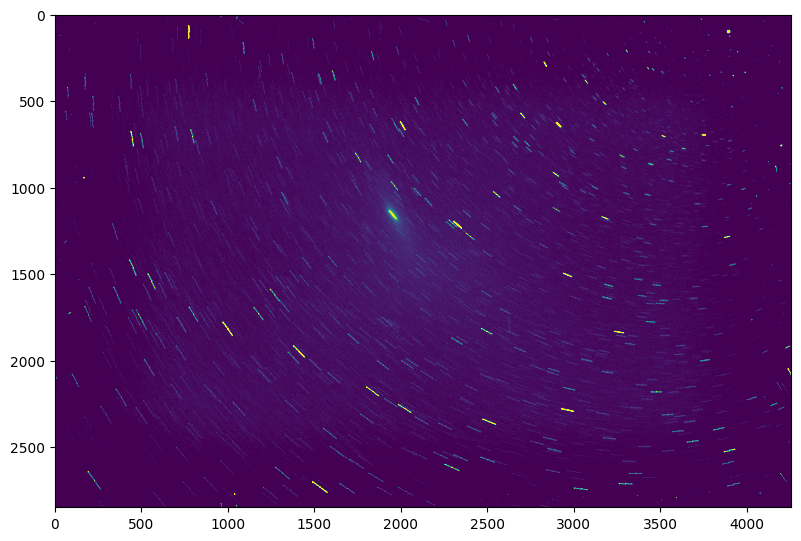

In [14]:
fig = plt.figure(figsize=(9.5,7))
# a = fig.add_subplot(1, 2, 1)
plt.imshow(aligned_cube[0], vmin=0, vmax=2000)

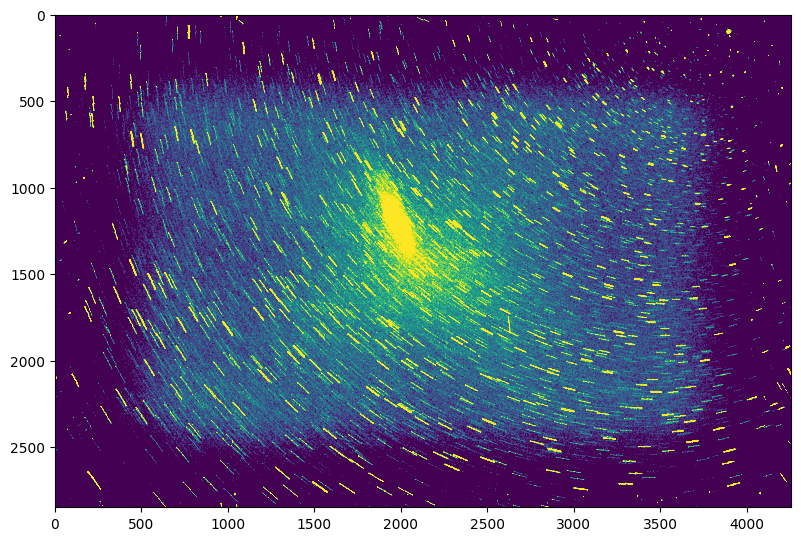

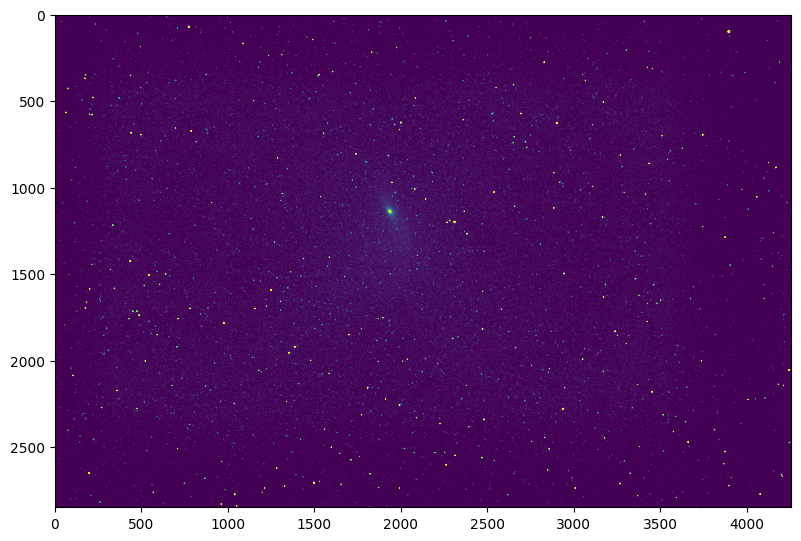

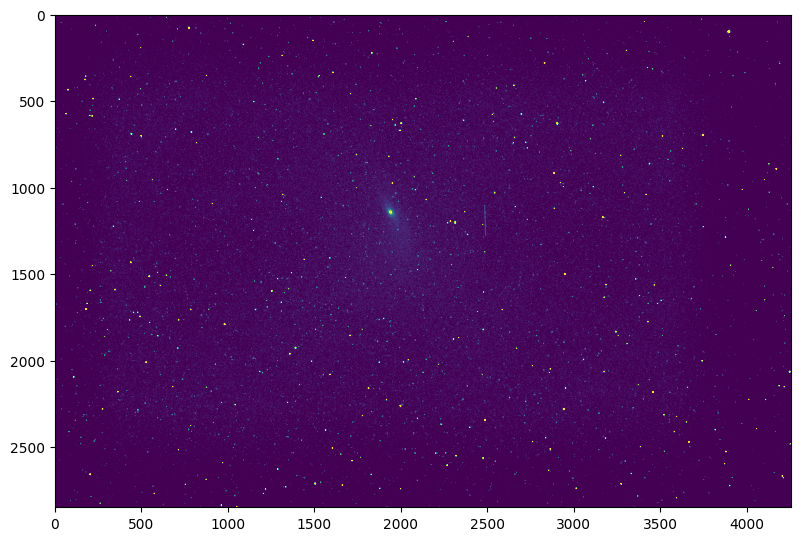

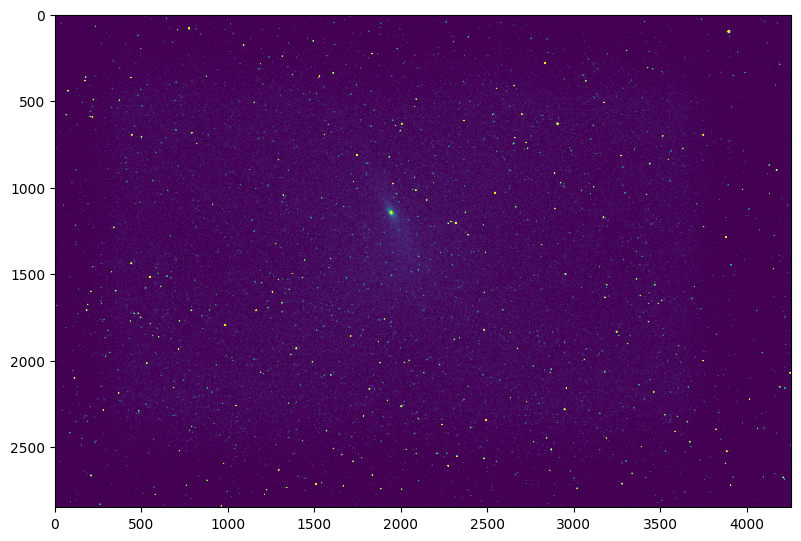

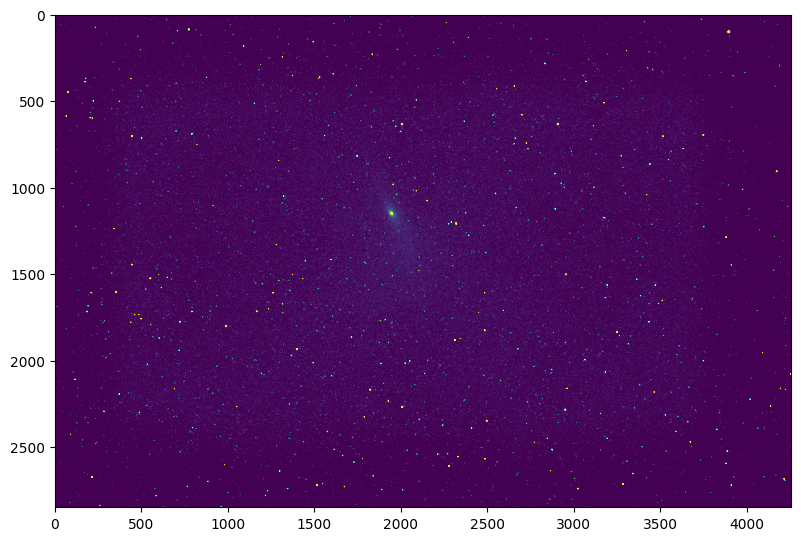

...

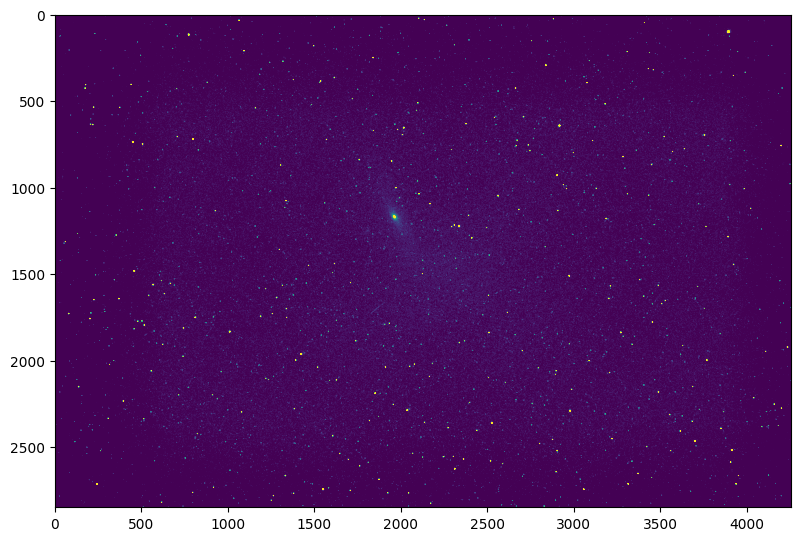

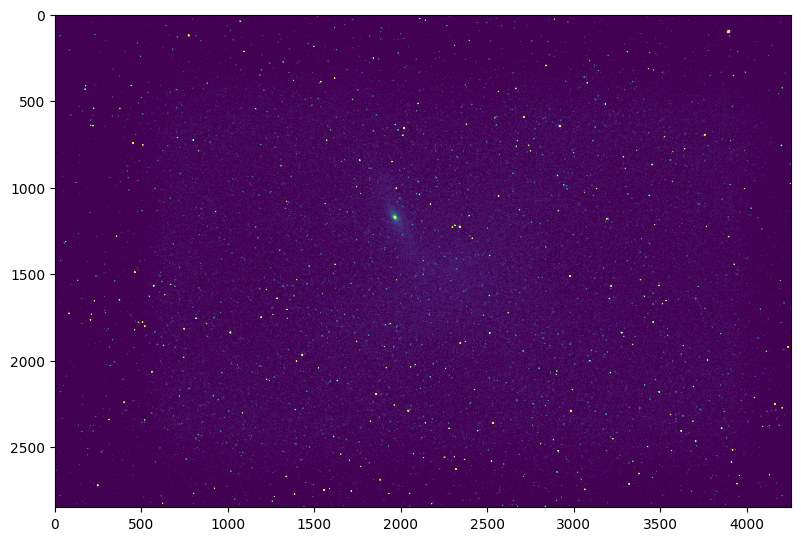

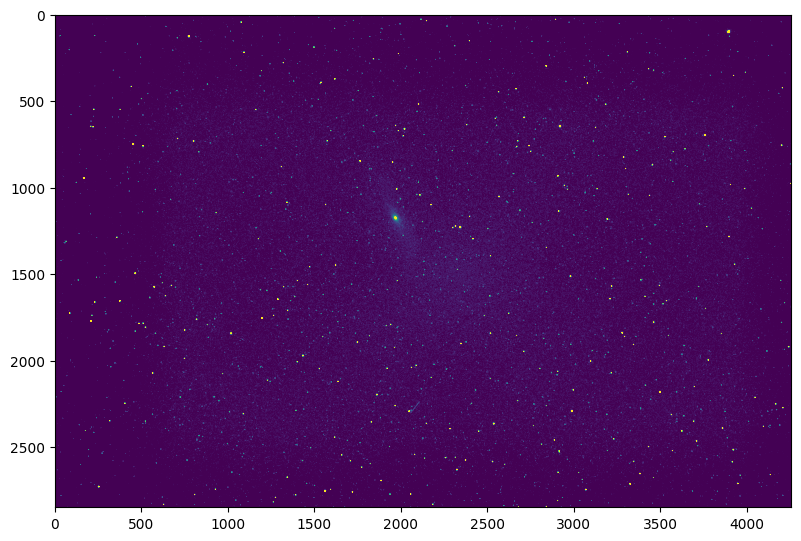

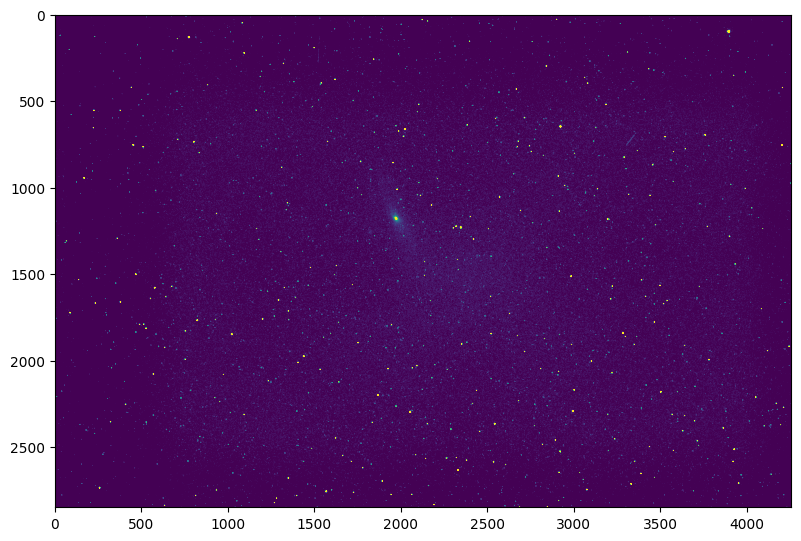

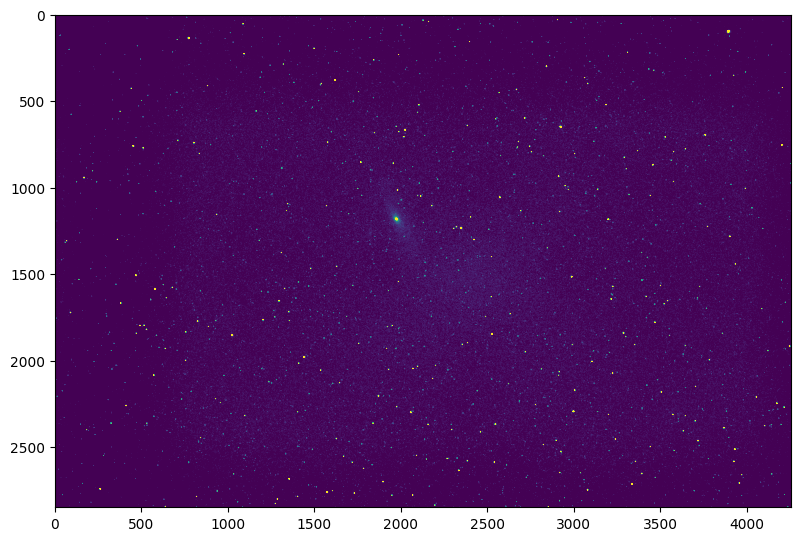

In [15]:
for i, plane in enumerate(list(range(aligned_cube.shape[0]))):
    fig = plt.figure(figsize=(9.5,7))
    plt.imshow(aligned_cube[i], vmin=0, vmax=200)
#     plt.imshow(cube[i], vmin=0, vmax=200)

In [16]:
shifts

array([[ 257.70086313,   93.91056964],
       [ 220.0808819 ,   80.0493615 ],
       [ 183.91306604,   66.3181894 ],
       [ 146.36294872,   53.63394881],
       [ 110.01305878,   39.96139955],
       [  72.18122098,   26.00917515],
       [  34.20033058,   11.67052387],
       [   0.        ,    0.        ],
       [ -34.20928568,  -11.76035985],
       [ -72.10563725,  -25.85294546],
       [-109.99167644,  -39.64925705],
       [-146.21216636,  -52.08096087],
       [-183.83819147,  -65.68589175],
       [-220.0399859 ,  -77.98595453],
       [-256.33889144,  -90.30864973]])

In [17]:
# for i in range(len(shifts)):
#     shifts[i][0] -= shifts[len(shifts)-1][0]
#     shifts[i][1] -= shifts[len(shifts)-1][1]

In [18]:
# shifts

In [19]:
fit_line(shifts, 0, start, step)

(1.0591073030772973,
 -1.833046031264365,
 806.6546894626563,
 array([300, 320, 340, 360, 380, 400, 420, 440, 460, 480, 500, 520, 540,
        560, 580]),
 array([ 257.70086313,  220.0808819 ,  183.91306604,  146.36294872,
         110.01305878,   72.18122098,   34.20033058,    0.        ,
         -34.20928568,  -72.10563725, -109.99167644, -146.21216636,
        -183.83819147, -220.0399859 , -256.33889144]),
 array([ 9.59983047e-01,  9.22441570e-04,  4.94027211e-01, -3.95169485e-01,
        -8.41388047e-02, -1.25505598e+00, -2.57502575e+00, -1.14435706e-01,
         2.33719924e+00,  1.10176829e+00, -1.23350271e-01,  3.17080434e-01,
        -6.48024054e-01, -1.88897855e-01,  1.73117233e-01]))

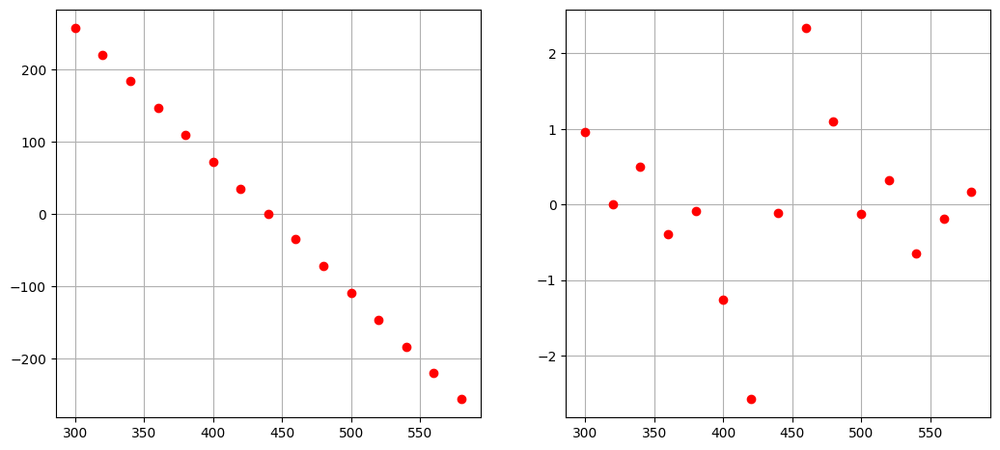

In [20]:
plot_residuals(shifts, 0, start, step)

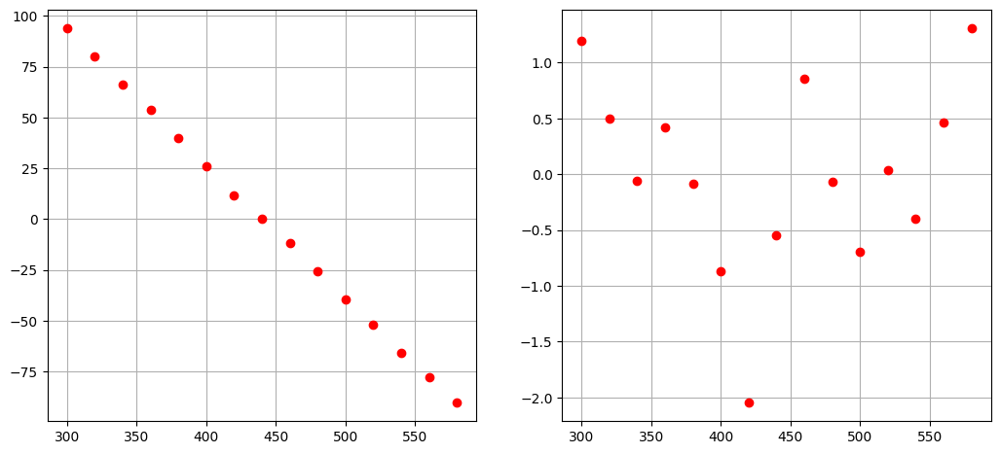

In [21]:
plot_residuals(shifts, 1, start, step)

## Generate cutouts

In [22]:
_, slope_x, intercept_x, _, _, _ = fit_line(shifts, 0, start, step) # note inversion of indices!
_, slope_y, intercept_y, _, _, _ = fit_line(shifts, 1, start, step)

image_size_x = imarray_base.shape[1]
image_size_y = imarray_base.shape[0]

In [23]:
# decide cutout size beforehand, compute corner coordinates for first and last frame,
# and adjust manually until no corners ever go out of the image.

cutout_size_x = 2514   # make sure these are even numbers
cutout_size_y = 2230

cutout_half_size_x = int(cutout_size_x / 2)
cutout_half_size_y = int(cutout_size_y / 2)
image_half_size_x = int(image_size_x / 2)
image_half_size_y = int(image_size_y / 2)

In [24]:
corner_coordinates(0)

top left corner X and Y:      1677.6546894626563 599.2111047718702
bottom right corner X and Y:  4191.654689462656 2829.21110477187


[[1677.6546894626563, 599.2111047718702],
 [4191.654689462656, 2829.21110477187]]

In [25]:
corner_coordinates(899)

top left corner X and Y:      29.74630735599203 7.377961865803627
bottom right corner X and Y:  2543.746307355992 2237.3779618658036


[[29.74630735599203, 7.377961865803627],
 [2543.746307355992, 2237.3779618658036]]

Here we need to make sure all corner coordinates are even-valued, in order to preserve the Bayer alignment of pixels in the cutouts.



In [26]:
# loop over input images and generate one cutout for each

for index, image_name in enumerate(image_list):
    
    # read
    f = fits.open(image_name)
    imarray = f[1].data
    f.close()
    
    # cutout coordinates
    coords = corner_coordinates(index, printinfo=False)
    
    # ensure they are even
    coords[0][0] = make_even(coords[0][0])
    coords[0][1] = make_even(coords[0][1])
    
    coords[1][0] = coords[0][0] + cutout_size_x
    coords[1][1] = coords[0][1] + cutout_size_y

    # make cutout
    cutout_slice = np.index_exp[coords[0][1]:coords[1][1],coords[0][0]:coords[1][0]]
    cutout = imarray[cutout_slice]
    
    # write to FITS    
    write_cutout(cutout, image_name)

Writing cutout:  /Users/busko/Projects/astrophotography_data/Andromeda_2022/135mm16s3200ISO/DSC01262.cutout.fits Tue Sep  5 12:47:23 2023
Writing cutout:  /Users/busko/Projects/astrophotography_data/Andromeda_2022/135mm16s3200ISO/DSC01263.cutout.fits Tue Sep  5 12:47:23 2023
Writing cutout:  /Users/busko/Projects/astrophotography_data/Andromeda_2022/135mm16s3200ISO/DSC01264.cutout.fits Tue Sep  5 12:47:23 2023
Writing cutout:  /Users/busko/Projects/astrophotography_data/Andromeda_2022/135mm16s3200ISO/DSC01265.cutout.fits Tue Sep  5 12:47:23 2023
Writing cutout:  /Users/busko/Projects/astrophotography_data/Andromeda_2022/135mm16s3200ISO/DSC01266.cutout.fits Tue Sep  5 12:47:23 2023
Writing cutout:  /Users/busko/Projects/astrophotography_data/Andromeda_2022/135mm16s3200ISO/DSC01267.cutout.fits Tue Sep  5 12:47:23 2023
Writing cutout:  /Users/busko/Projects/astrophotography_data/Andromeda_2022/135mm16s3200ISO/DSC01268.cutout.fits Tue Sep  5 12:47:23 2023
Writing cutout:  /Users/busko/Proj

Writing cutout:  /Users/busko/Projects/astrophotography_data/Andromeda_2022/135mm16s3200ISO/DSC01322.cutout.fits Tue Sep  5 12:47:28 2023
Writing cutout:  /Users/busko/Projects/astrophotography_data/Andromeda_2022/135mm16s3200ISO/DSC01323.cutout.fits Tue Sep  5 12:47:28 2023
Writing cutout:  /Users/busko/Projects/astrophotography_data/Andromeda_2022/135mm16s3200ISO/DSC01324.cutout.fits Tue Sep  5 12:47:28 2023
Writing cutout:  /Users/busko/Projects/astrophotography_data/Andromeda_2022/135mm16s3200ISO/DSC01325.cutout.fits Tue Sep  5 12:47:28 2023
Writing cutout:  /Users/busko/Projects/astrophotography_data/Andromeda_2022/135mm16s3200ISO/DSC01326.cutout.fits Tue Sep  5 12:47:28 2023
Writing cutout:  /Users/busko/Projects/astrophotography_data/Andromeda_2022/135mm16s3200ISO/DSC01327.cutout.fits Tue Sep  5 12:47:28 2023
Writing cutout:  /Users/busko/Projects/astrophotography_data/Andromeda_2022/135mm16s3200ISO/DSC01328.cutout.fits Tue Sep  5 12:47:28 2023
Writing cutout:  /Users/busko/Proj

Writing cutout:  /Users/busko/Projects/astrophotography_data/Andromeda_2022/135mm16s3200ISO/DSC01382.cutout.fits Tue Sep  5 12:47:33 2023
Writing cutout:  /Users/busko/Projects/astrophotography_data/Andromeda_2022/135mm16s3200ISO/DSC01383.cutout.fits Tue Sep  5 12:47:33 2023
Writing cutout:  /Users/busko/Projects/astrophotography_data/Andromeda_2022/135mm16s3200ISO/DSC01384.cutout.fits Tue Sep  5 12:47:33 2023
Writing cutout:  /Users/busko/Projects/astrophotography_data/Andromeda_2022/135mm16s3200ISO/DSC01385.cutout.fits Tue Sep  5 12:47:33 2023
Writing cutout:  /Users/busko/Projects/astrophotography_data/Andromeda_2022/135mm16s3200ISO/DSC01386.cutout.fits Tue Sep  5 12:47:33 2023
Writing cutout:  /Users/busko/Projects/astrophotography_data/Andromeda_2022/135mm16s3200ISO/DSC01387.cutout.fits Tue Sep  5 12:47:33 2023
Writing cutout:  /Users/busko/Projects/astrophotography_data/Andromeda_2022/135mm16s3200ISO/DSC01388.cutout.fits Tue Sep  5 12:47:34 2023
Writing cutout:  /Users/busko/Proj

Writing cutout:  /Users/busko/Projects/astrophotography_data/Andromeda_2022/135mm16s3200ISO/DSC01442.cutout.fits Tue Sep  5 12:47:38 2023
Writing cutout:  /Users/busko/Projects/astrophotography_data/Andromeda_2022/135mm16s3200ISO/DSC01443.cutout.fits Tue Sep  5 12:47:38 2023
Writing cutout:  /Users/busko/Projects/astrophotography_data/Andromeda_2022/135mm16s3200ISO/DSC01444.cutout.fits Tue Sep  5 12:47:38 2023
Writing cutout:  /Users/busko/Projects/astrophotography_data/Andromeda_2022/135mm16s3200ISO/DSC01445.cutout.fits Tue Sep  5 12:47:38 2023
Writing cutout:  /Users/busko/Projects/astrophotography_data/Andromeda_2022/135mm16s3200ISO/DSC01446.cutout.fits Tue Sep  5 12:47:38 2023
Writing cutout:  /Users/busko/Projects/astrophotography_data/Andromeda_2022/135mm16s3200ISO/DSC01447.cutout.fits Tue Sep  5 12:47:38 2023
Writing cutout:  /Users/busko/Projects/astrophotography_data/Andromeda_2022/135mm16s3200ISO/DSC01448.cutout.fits Tue Sep  5 12:47:39 2023
Writing cutout:  /Users/busko/Proj

Writing cutout:  /Users/busko/Projects/astrophotography_data/Andromeda_2022/135mm16s3200ISO/DSC01502.cutout.fits Tue Sep  5 12:47:43 2023
Writing cutout:  /Users/busko/Projects/astrophotography_data/Andromeda_2022/135mm16s3200ISO/DSC01503.cutout.fits Tue Sep  5 12:47:43 2023
Writing cutout:  /Users/busko/Projects/astrophotography_data/Andromeda_2022/135mm16s3200ISO/DSC01504.cutout.fits Tue Sep  5 12:47:43 2023
Writing cutout:  /Users/busko/Projects/astrophotography_data/Andromeda_2022/135mm16s3200ISO/DSC01505.cutout.fits Tue Sep  5 12:47:43 2023
Writing cutout:  /Users/busko/Projects/astrophotography_data/Andromeda_2022/135mm16s3200ISO/DSC01506.cutout.fits Tue Sep  5 12:47:43 2023
Writing cutout:  /Users/busko/Projects/astrophotography_data/Andromeda_2022/135mm16s3200ISO/DSC01507.cutout.fits Tue Sep  5 12:47:44 2023
Writing cutout:  /Users/busko/Projects/astrophotography_data/Andromeda_2022/135mm16s3200ISO/DSC01508.cutout.fits Tue Sep  5 12:47:44 2023
Writing cutout:  /Users/busko/Proj

Writing cutout:  /Users/busko/Projects/astrophotography_data/Andromeda_2022/135mm16s3200ISO/DSC01562.cutout.fits Tue Sep  5 12:47:48 2023
Writing cutout:  /Users/busko/Projects/astrophotography_data/Andromeda_2022/135mm16s3200ISO/DSC01563.cutout.fits Tue Sep  5 12:47:48 2023
Writing cutout:  /Users/busko/Projects/astrophotography_data/Andromeda_2022/135mm16s3200ISO/DSC01564.cutout.fits Tue Sep  5 12:47:48 2023
Writing cutout:  /Users/busko/Projects/astrophotography_data/Andromeda_2022/135mm16s3200ISO/DSC01565.cutout.fits Tue Sep  5 12:47:48 2023
Writing cutout:  /Users/busko/Projects/astrophotography_data/Andromeda_2022/135mm16s3200ISO/DSC01566.cutout.fits Tue Sep  5 12:47:49 2023
Writing cutout:  /Users/busko/Projects/astrophotography_data/Andromeda_2022/135mm16s3200ISO/DSC01567.cutout.fits Tue Sep  5 12:47:49 2023
Writing cutout:  /Users/busko/Projects/astrophotography_data/Andromeda_2022/135mm16s3200ISO/DSC01568.cutout.fits Tue Sep  5 12:47:49 2023
Writing cutout:  /Users/busko/Proj

Writing cutout:  /Users/busko/Projects/astrophotography_data/Andromeda_2022/135mm16s3200ISO/DSC01622.cutout.fits Tue Sep  5 12:47:53 2023
Writing cutout:  /Users/busko/Projects/astrophotography_data/Andromeda_2022/135mm16s3200ISO/DSC01623.cutout.fits Tue Sep  5 12:47:54 2023
Writing cutout:  /Users/busko/Projects/astrophotography_data/Andromeda_2022/135mm16s3200ISO/DSC01624.cutout.fits Tue Sep  5 12:47:54 2023
Writing cutout:  /Users/busko/Projects/astrophotography_data/Andromeda_2022/135mm16s3200ISO/DSC01625.cutout.fits Tue Sep  5 12:47:54 2023
Writing cutout:  /Users/busko/Projects/astrophotography_data/Andromeda_2022/135mm16s3200ISO/DSC01626.cutout.fits Tue Sep  5 12:47:54 2023
Writing cutout:  /Users/busko/Projects/astrophotography_data/Andromeda_2022/135mm16s3200ISO/DSC01627.cutout.fits Tue Sep  5 12:47:54 2023
Writing cutout:  /Users/busko/Projects/astrophotography_data/Andromeda_2022/135mm16s3200ISO/DSC01628.cutout.fits Tue Sep  5 12:47:54 2023
Writing cutout:  /Users/busko/Proj

Writing cutout:  /Users/busko/Projects/astrophotography_data/Andromeda_2022/135mm16s3200ISO/DSC01682.cutout.fits Tue Sep  5 12:47:58 2023
Writing cutout:  /Users/busko/Projects/astrophotography_data/Andromeda_2022/135mm16s3200ISO/DSC01683.cutout.fits Tue Sep  5 12:47:59 2023
Writing cutout:  /Users/busko/Projects/astrophotography_data/Andromeda_2022/135mm16s3200ISO/DSC01684.cutout.fits Tue Sep  5 12:47:59 2023
Writing cutout:  /Users/busko/Projects/astrophotography_data/Andromeda_2022/135mm16s3200ISO/DSC01685.cutout.fits Tue Sep  5 12:47:59 2023
Writing cutout:  /Users/busko/Projects/astrophotography_data/Andromeda_2022/135mm16s3200ISO/DSC01686.cutout.fits Tue Sep  5 12:47:59 2023
Writing cutout:  /Users/busko/Projects/astrophotography_data/Andromeda_2022/135mm16s3200ISO/DSC01687.cutout.fits Tue Sep  5 12:47:59 2023
Writing cutout:  /Users/busko/Projects/astrophotography_data/Andromeda_2022/135mm16s3200ISO/DSC01688.cutout.fits Tue Sep  5 12:47:59 2023
Writing cutout:  /Users/busko/Proj

Writing cutout:  /Users/busko/Projects/astrophotography_data/Andromeda_2022/135mm16s3200ISO/DSC01742.cutout.fits Tue Sep  5 12:48:04 2023
Writing cutout:  /Users/busko/Projects/astrophotography_data/Andromeda_2022/135mm16s3200ISO/DSC01743.cutout.fits Tue Sep  5 12:48:04 2023
Writing cutout:  /Users/busko/Projects/astrophotography_data/Andromeda_2022/135mm16s3200ISO/DSC01744.cutout.fits Tue Sep  5 12:48:04 2023
Writing cutout:  /Users/busko/Projects/astrophotography_data/Andromeda_2022/135mm16s3200ISO/DSC01745.cutout.fits Tue Sep  5 12:48:04 2023
Writing cutout:  /Users/busko/Projects/astrophotography_data/Andromeda_2022/135mm16s3200ISO/DSC01746.cutout.fits Tue Sep  5 12:48:04 2023
Writing cutout:  /Users/busko/Projects/astrophotography_data/Andromeda_2022/135mm16s3200ISO/DSC01747.cutout.fits Tue Sep  5 12:48:04 2023
Writing cutout:  /Users/busko/Projects/astrophotography_data/Andromeda_2022/135mm16s3200ISO/DSC01748.cutout.fits Tue Sep  5 12:48:04 2023
Writing cutout:  /Users/busko/Proj

Writing cutout:  /Users/busko/Projects/astrophotography_data/Andromeda_2022/135mm16s3200ISO/DSC01802.cutout.fits Tue Sep  5 12:48:09 2023
Writing cutout:  /Users/busko/Projects/astrophotography_data/Andromeda_2022/135mm16s3200ISO/DSC01803.cutout.fits Tue Sep  5 12:48:09 2023
Writing cutout:  /Users/busko/Projects/astrophotography_data/Andromeda_2022/135mm16s3200ISO/DSC01804.cutout.fits Tue Sep  5 12:48:09 2023
Writing cutout:  /Users/busko/Projects/astrophotography_data/Andromeda_2022/135mm16s3200ISO/DSC01805.cutout.fits Tue Sep  5 12:48:09 2023
Writing cutout:  /Users/busko/Projects/astrophotography_data/Andromeda_2022/135mm16s3200ISO/DSC01806.cutout.fits Tue Sep  5 12:48:09 2023
Writing cutout:  /Users/busko/Projects/astrophotography_data/Andromeda_2022/135mm16s3200ISO/DSC01807.cutout.fits Tue Sep  5 12:48:09 2023
Writing cutout:  /Users/busko/Projects/astrophotography_data/Andromeda_2022/135mm16s3200ISO/DSC01808.cutout.fits Tue Sep  5 12:48:09 2023
Writing cutout:  /Users/busko/Proj

Writing cutout:  /Users/busko/Projects/astrophotography_data/Andromeda_2022/135mm16s3200ISO/DSC01862.cutout.fits Tue Sep  5 12:48:14 2023
Writing cutout:  /Users/busko/Projects/astrophotography_data/Andromeda_2022/135mm16s3200ISO/DSC01863.cutout.fits Tue Sep  5 12:48:14 2023
Writing cutout:  /Users/busko/Projects/astrophotography_data/Andromeda_2022/135mm16s3200ISO/DSC01864.cutout.fits Tue Sep  5 12:48:14 2023
Writing cutout:  /Users/busko/Projects/astrophotography_data/Andromeda_2022/135mm16s3200ISO/DSC01865.cutout.fits Tue Sep  5 12:48:14 2023
Writing cutout:  /Users/busko/Projects/astrophotography_data/Andromeda_2022/135mm16s3200ISO/DSC01866.cutout.fits Tue Sep  5 12:48:14 2023
Writing cutout:  /Users/busko/Projects/astrophotography_data/Andromeda_2022/135mm16s3200ISO/DSC01867.cutout.fits Tue Sep  5 12:48:14 2023
Writing cutout:  /Users/busko/Projects/astrophotography_data/Andromeda_2022/135mm16s3200ISO/DSC01868.cutout.fits Tue Sep  5 12:48:14 2023
Writing cutout:  /Users/busko/Proj

Writing cutout:  /Users/busko/Projects/astrophotography_data/Andromeda_2022/135mm16s3200ISO/DSC01922.cutout.fits Tue Sep  5 12:48:19 2023
Writing cutout:  /Users/busko/Projects/astrophotography_data/Andromeda_2022/135mm16s3200ISO/DSC01923.cutout.fits Tue Sep  5 12:48:19 2023
Writing cutout:  /Users/busko/Projects/astrophotography_data/Andromeda_2022/135mm16s3200ISO/DSC01924.cutout.fits Tue Sep  5 12:48:19 2023
Writing cutout:  /Users/busko/Projects/astrophotography_data/Andromeda_2022/135mm16s3200ISO/DSC01925.cutout.fits Tue Sep  5 12:48:19 2023
Writing cutout:  /Users/busko/Projects/astrophotography_data/Andromeda_2022/135mm16s3200ISO/DSC01926.cutout.fits Tue Sep  5 12:48:19 2023
Writing cutout:  /Users/busko/Projects/astrophotography_data/Andromeda_2022/135mm16s3200ISO/DSC01927.cutout.fits Tue Sep  5 12:48:19 2023
Writing cutout:  /Users/busko/Projects/astrophotography_data/Andromeda_2022/135mm16s3200ISO/DSC01928.cutout.fits Tue Sep  5 12:48:19 2023
Writing cutout:  /Users/busko/Proj

Writing cutout:  /Users/busko/Projects/astrophotography_data/Andromeda_2022/135mm16s3200ISO/DSC01982.cutout.fits Tue Sep  5 12:48:24 2023
Writing cutout:  /Users/busko/Projects/astrophotography_data/Andromeda_2022/135mm16s3200ISO/DSC01983.cutout.fits Tue Sep  5 12:48:24 2023
Writing cutout:  /Users/busko/Projects/astrophotography_data/Andromeda_2022/135mm16s3200ISO/DSC01984.cutout.fits Tue Sep  5 12:48:24 2023
Writing cutout:  /Users/busko/Projects/astrophotography_data/Andromeda_2022/135mm16s3200ISO/DSC01985.cutout.fits Tue Sep  5 12:48:24 2023
Writing cutout:  /Users/busko/Projects/astrophotography_data/Andromeda_2022/135mm16s3200ISO/DSC01986.cutout.fits Tue Sep  5 12:48:24 2023
Writing cutout:  /Users/busko/Projects/astrophotography_data/Andromeda_2022/135mm16s3200ISO/DSC01987.cutout.fits Tue Sep  5 12:48:24 2023
Writing cutout:  /Users/busko/Projects/astrophotography_data/Andromeda_2022/135mm16s3200ISO/DSC01988.cutout.fits Tue Sep  5 12:48:25 2023
Writing cutout:  /Users/busko/Proj

Writing cutout:  /Users/busko/Projects/astrophotography_data/Andromeda_2022/135mm16s3200ISO/DSC02042.cutout.fits Tue Sep  5 12:48:29 2023
Writing cutout:  /Users/busko/Projects/astrophotography_data/Andromeda_2022/135mm16s3200ISO/DSC02043.cutout.fits Tue Sep  5 12:48:29 2023
Writing cutout:  /Users/busko/Projects/astrophotography_data/Andromeda_2022/135mm16s3200ISO/DSC02044.cutout.fits Tue Sep  5 12:48:29 2023
Writing cutout:  /Users/busko/Projects/astrophotography_data/Andromeda_2022/135mm16s3200ISO/DSC02045.cutout.fits Tue Sep  5 12:48:30 2023
Writing cutout:  /Users/busko/Projects/astrophotography_data/Andromeda_2022/135mm16s3200ISO/DSC02046.cutout.fits Tue Sep  5 12:48:30 2023
Writing cutout:  /Users/busko/Projects/astrophotography_data/Andromeda_2022/135mm16s3200ISO/DSC02047.cutout.fits Tue Sep  5 12:48:30 2023
Writing cutout:  /Users/busko/Projects/astrophotography_data/Andromeda_2022/135mm16s3200ISO/DSC02048.cutout.fits Tue Sep  5 12:48:30 2023
Writing cutout:  /Users/busko/Proj

Writing cutout:  /Users/busko/Projects/astrophotography_data/Andromeda_2022/135mm16s3200ISO/DSC02102.cutout.fits Tue Sep  5 12:48:34 2023
Writing cutout:  /Users/busko/Projects/astrophotography_data/Andromeda_2022/135mm16s3200ISO/DSC02103.cutout.fits Tue Sep  5 12:48:34 2023
Writing cutout:  /Users/busko/Projects/astrophotography_data/Andromeda_2022/135mm16s3200ISO/DSC02104.cutout.fits Tue Sep  5 12:48:35 2023
Writing cutout:  /Users/busko/Projects/astrophotography_data/Andromeda_2022/135mm16s3200ISO/DSC02105.cutout.fits Tue Sep  5 12:48:35 2023
Writing cutout:  /Users/busko/Projects/astrophotography_data/Andromeda_2022/135mm16s3200ISO/DSC02106.cutout.fits Tue Sep  5 12:48:35 2023
Writing cutout:  /Users/busko/Projects/astrophotography_data/Andromeda_2022/135mm16s3200ISO/DSC02107.cutout.fits Tue Sep  5 12:48:35 2023
Writing cutout:  /Users/busko/Projects/astrophotography_data/Andromeda_2022/135mm16s3200ISO/DSC02108.cutout.fits Tue Sep  5 12:48:35 2023
Writing cutout:  /Users/busko/Proj

## Verify cutouts

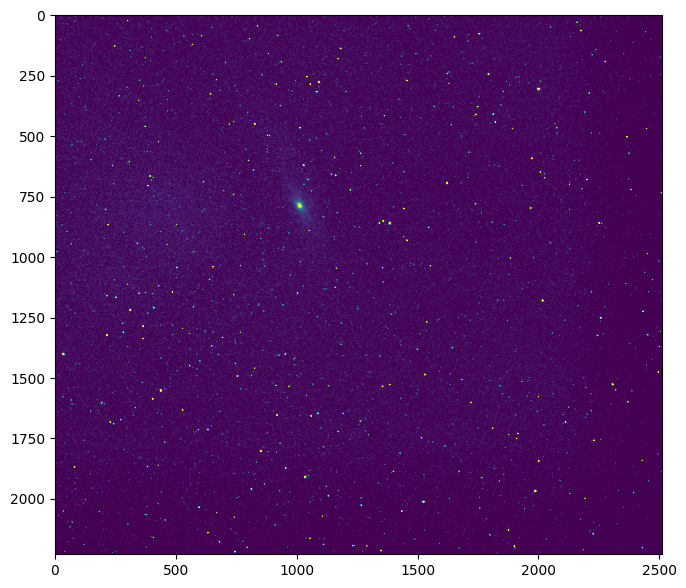

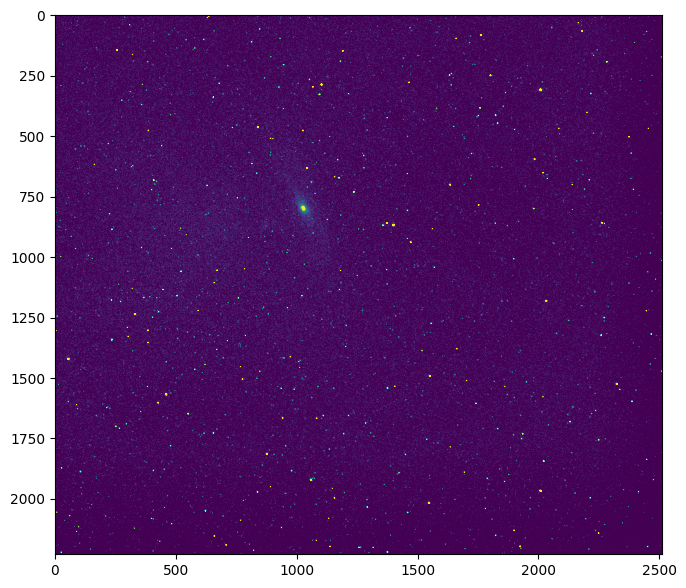

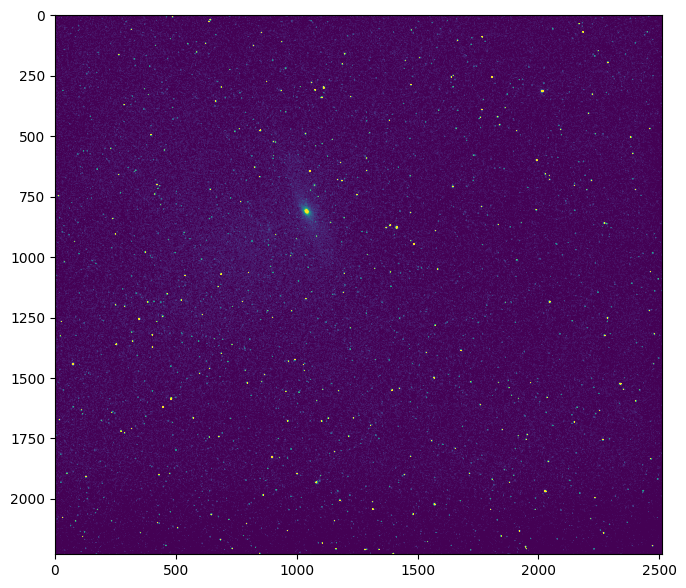

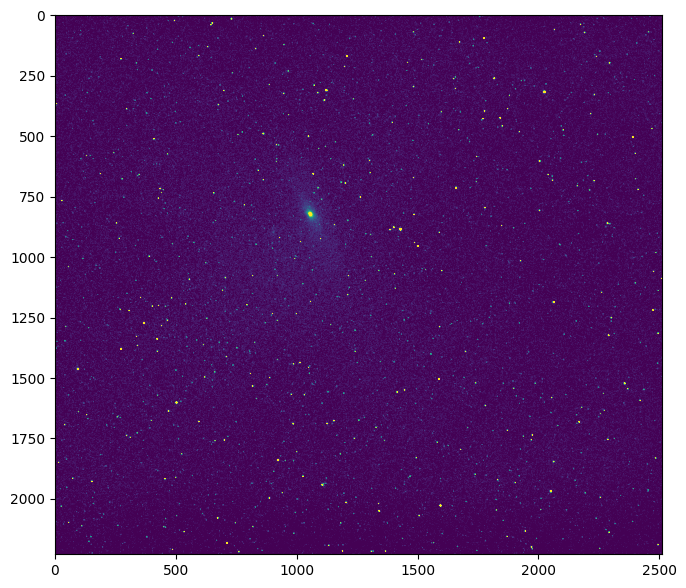

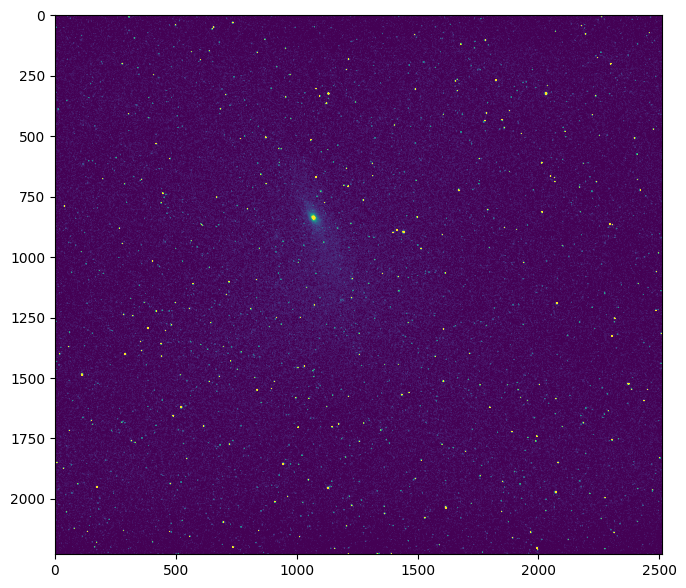

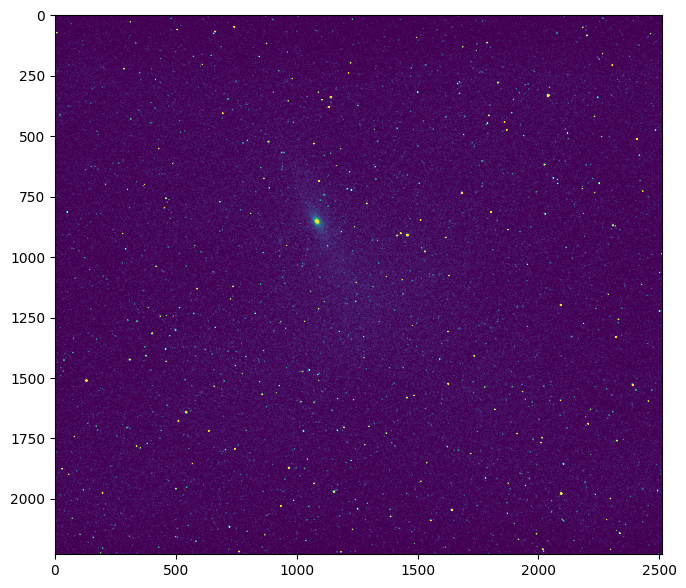

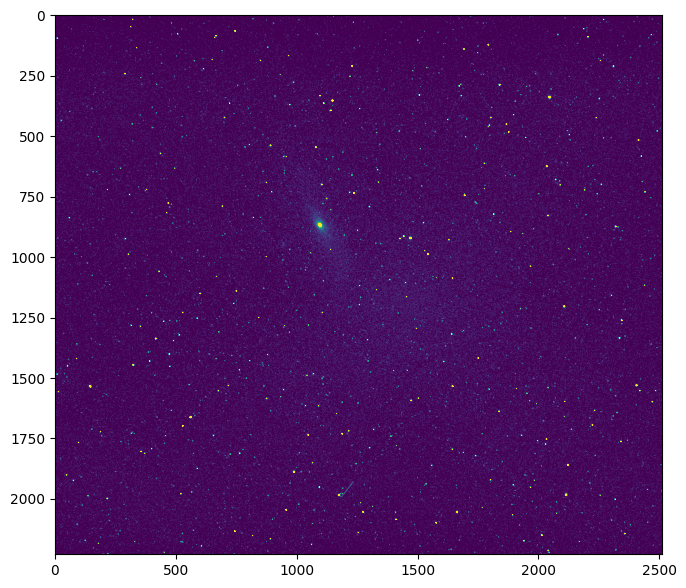

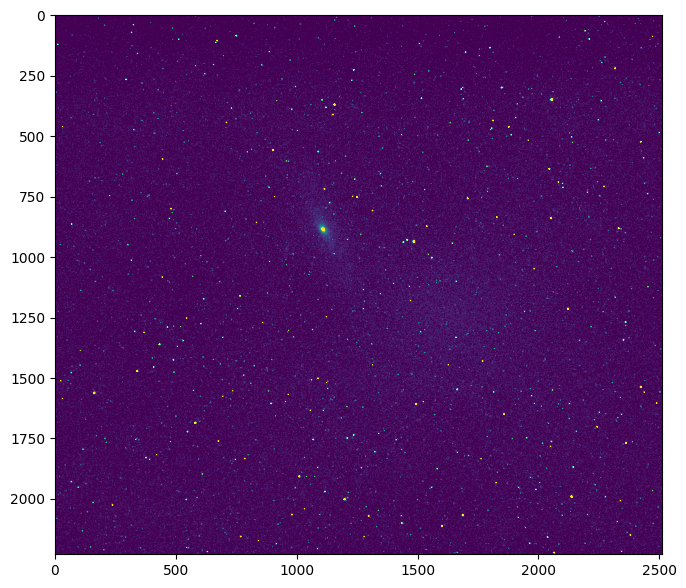

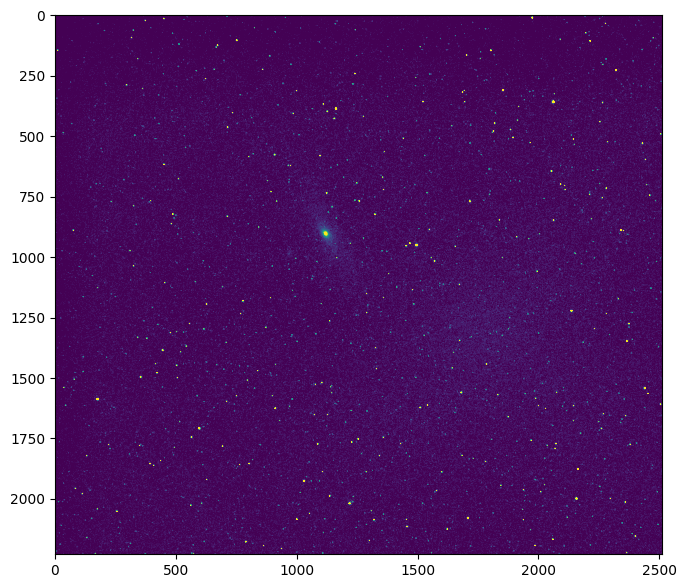

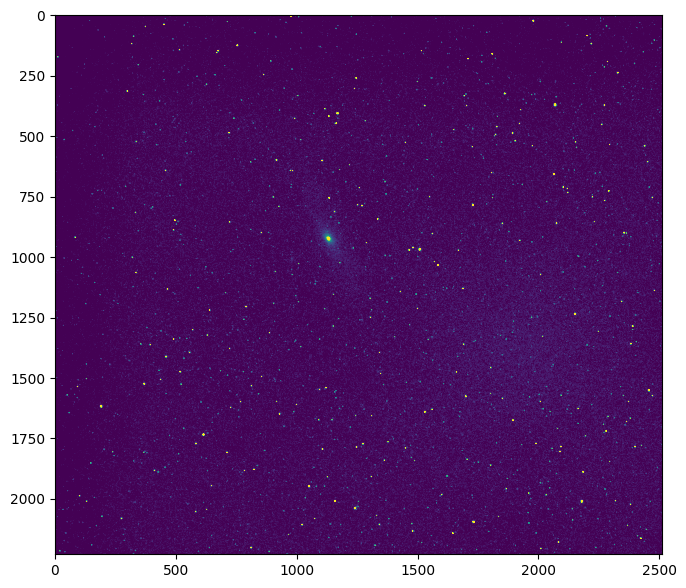

In [27]:
accum = np.zeros(shape=(cutout_size_y, cutout_size_x))

for image_name in image_list[0:900:90]:
    
    cutout_name = image_name.replace('.bkg_subtracted.fits', '.cutout.fits')
    
    f = fits.open(cutout_name)
    imarray = f[1].data
    f.close()
    
    accum += imarray
    
    fig = plt.figure(figsize=(9.5,7))
    plt.imshow(imarray, vmin=0, vmax=200)

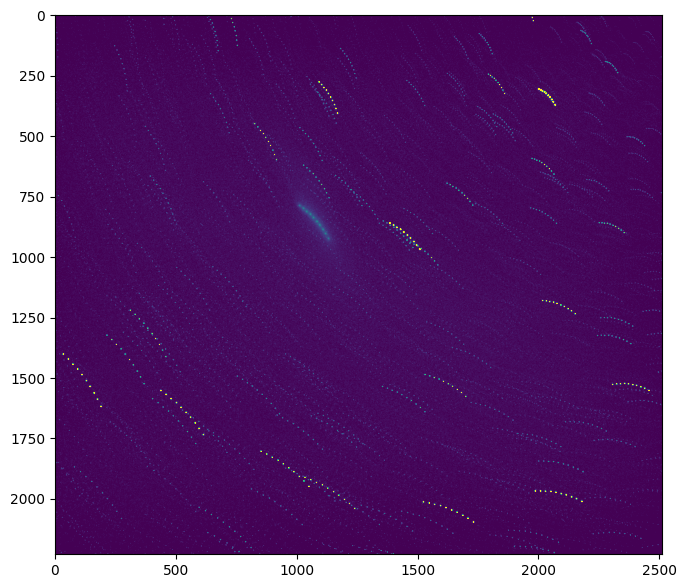

In [28]:
fig = plt.figure(figsize=(9.5,7))
plt.imshow(accum, vmin=0, vmax=2000)